df = pd.DataFrame(columns=["X", "Y", "Z", "value"])
df['X'] = [np.random.randint(1, 10) for i in range(100)]
df['Y'] = [np.random.randint(1, 10) for i in range(100)]
df['Z'] = [np.random.randint(1, 10) for i in range(100)]
df['value'] = [np.random.randint(500, 1000)/10 for i in range(100)]
df = df.drop_duplicates(subset=["X", "Y", "Z"])
df.to_excel("data/input.xlsx", index=False)

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action='ignore')

Корреляционная функция между двумя величинами с одинаковой дисперсией равно:
    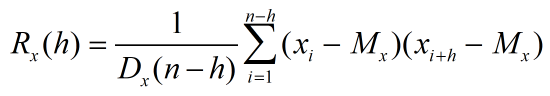
   h - шаг между величинами

# Используемые функции

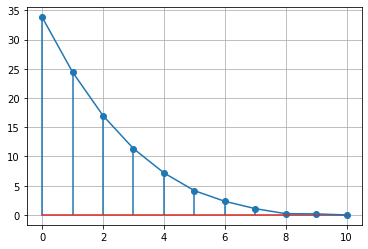

In [62]:
"""
Простая реализация корр.
"""
def corr_for_arr(arr, h_max=10, norm=True):
    
    D = np.var(arr)
    M = np.mean(arr)
    length = len(arr)
    R_list = []
    for h in range(h_max+1):
        
        R = 0
        for i in range(h, length-h):
            R_now = (arr[i]-M)*(arr[i+h]-M)
            R += R_now
            
        
        R /= length
        
        if norm:
            R /= D
        
        R_list.append(R)

    return R_list   



# Пример 1
values = np.array(range(1, 21)) + np.random.rand(20)
result = corr_for_arr(values, norm=False)
h_list = range(11)

plt.stem(h_list, result)
plt.plot(h_list, result, "-")
plt.grid(True)
plt.show()

In [7]:
"""
Удаление выбросов с использованием межквартильного размаха (IQR)
"""
def get_filter_df(df, col):
    # Определяем Q1 и Q3 квартили
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    
    # Вычисляем IQR
    IQR = Q3 - Q1
    
    # Определяем границы для определения выбросов
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Фильтруем выбросы
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

In [8]:
"""
Создание матрицы расстояний
"""
def matrix_distance(points):
    l = len(points)
    matrix = np.zeros((l, l))
    
    for i in range(l):
        for j in range(i, l):
            distance = np.linalg.norm(points[i] - points[j])
            matrix[i, j] = distance
    
    return matrix

# Пример
B = np.array([[1, 2, 3], [3, 4, 5], [1, 5, 7], [1, 2, 4]])
matrix_distance(B)

array([[0.        , 3.46410162, 5.        , 1.        ],
       [0.        , 0.        , 3.        , 3.        ],
       [0.        , 0.        , 0.        , 4.24264069],
       [0.        , 0.        , 0.        , 0.        ]])

In [9]:
"""
Создание матрицы расстояний по X и Y
"""
def matrix_distance_XY(points):
    l = len(points)
    X = np.zeros((l, l))
    Y = np.zeros((l, l))
    
    for i in range(l):
        for j in range(i, l):
            dx = abs(points[i, 0] - points[j, 0])
            dy = abs(points[i, 1] - points[j, 1])
            X[i, j] = dx
            Y[i, j] = dy
    
    return X, Y

# Пример
B = np.array([[1, 2, 3], [3, 4, 5], [1, 5, 7], [1, 2, 4]])
matrix_distance_XY(B)

(array([[0., 2., 0., 0.],
        [0., 0., 2., 2.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]]),
 array([[0., 2., 3., 0.],
        [0., 0., 1., 2.],
        [0., 0., 0., 3.],
        [0., 0., 0., 0.]]))

In [10]:
"""
Для получения корр. коэф. при разных x
"""
def get_R(x):
    return filter_matrix_1(points, values, [x-1, x])

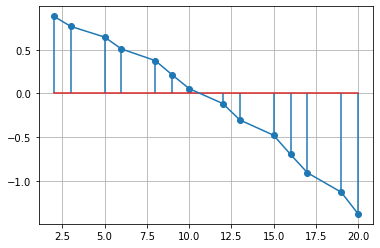

In [11]:
"""
-Фильтрация значений в матрице, в зависимости от рассматриваемого диапазона
-Определение значения корреляции
-Построение функции корреляции
"""
def filter_matrix_1(points, values, size_dist=[0, 1], M=None, D=None):
    
    matrix_length = matrix_distance(points)
    
    
    matrix_flag = np.where((matrix_length > size_dist[0]) & (matrix_length <= size_dist[1]), 1, 0)
    
    p1, p2 = np.where((matrix_length > size_dist[0]) & (matrix_length <= size_dist[1]))
    p_unique = np.unique(np.concatenate([p1, p2]))
    
    #D = np.var(values[p_unique])
    #M = np.mean(values[p_unique])
    
    if D is None:
        D = np.var(values)
    if M is None:
        M = np.mean(values)
    
    length = len(p_unique)
    R = 0
    
    if len(p1) == 0:
        return np.nan
    
    
    for i in range(len(p1)):
        R_now = (values[p1[i]]-M)*(values[p2[i]]-M)
        R += R_now
        
    R = R/len(p1)/D
    
    return R


# Пример 1
points = np.array([[i, i] for i in range(1, 21)])
values = np.array(range(1, 21)) + np.random.rand(20)
arr_test = np.array([[get_R(i), i]  for i in range(1, 21)])
df_test = pd.DataFrame(arr_test).dropna()
plt.stem(df_test[1], df_test[0])
plt.plot(df_test[1], df_test[0], "-")
plt.grid(True)
plt.show()

In [12]:
def create_matrix_corr_XY(points, values, step=1, size=5, M=None, D=None):
    """
    Функция построения корр. матрицы с постоянным шагом step.
    size - размер квадратной корр. матрицы. 
        На выходе matrix_corr
            Где i-индекс строки, j- индекс столбца
            Элементы матрицы это коэф. корр. при x = (i+1)*step и y = (j+1)*step
    """
    X, Y = matrix_distance_XY(points)

    matrix_corr = np.zeros((size, size))
    
        
    if D is None:
        D = np.var(values)
    if M is None:
        M = np.mean(values)
    

    for dx in range(0, size*step, step):
        left_x = dx
        right_x = dx+step
        matrix_x = np.where((X > left_x) & (X <= right_x), X, 0)
        
        
        for dy in range(0, size*step, step):
            left_y = dy
            right_y = dy+step
            matrix_y = np.where((Y > left_y) & (Y <= right_y), 1, 0)

            matrix_xy = matrix_x * matrix_y
            x1y1, x2y2 = np.where(matrix_xy != 0)  # индексы х1y1-строк и х2y2-столбцов

            """
            Коэф. корр.
            """
            p_unique = np.unique(np.concatenate([x1y1, x2y2]))
            
            #D = np.var(values[p_unique])
            #M = np.mean(values[p_unique])
            
            R = 0
            
            for i in range(len(x1y1)):
                R_now = (values[x1y1[i]]-M)*(values[x2y2[i]]-M)
                R += R_now
                
            R = R/(D*(len(x1y1)))

            matrix_corr[int(dx/step), int(dy/step)] = R
    
    return matrix_corr


# Пример 1
print("Точки с зависимостью [x+i, y+i]")
points = np.array([[i, i] for i in range(20)])
values = np.array(range(20)) + np.random.rand(20)

matrix_corr = create_matrix_corr_XY(points, values)
print(matrix_corr)
print()

# Пример 2
print("Случайные точки x от [1, 5], y+1")
points = np.array([[np.random.randint(1, 5), i] for i in range(20)])
values = np.array(range(20)) + np.random.rand(20)
matrix_corr = create_matrix_corr_XY(points, values)
print(matrix_corr)
print()

# Пример 3
print("Случайные точки от [1, 10]")
points = np.array([[np.random.randint(1, 10), np.random.randint(1, 10)] for i in range(20)])
values = np.array(range(20)) + np.random.rand(20)
matrix_corr = create_matrix_corr_XY(points, values, step=1, size=5)
print(matrix_corr)

Точки с зависимостью [x+i, y+i]
[[0.88910722        nan        nan        nan        nan]
 [       nan 0.77051918        nan        nan        nan]
 [       nan        nan 0.6486824         nan        nan]
 [       nan        nan        nan 0.52295717        nan]
 [       nan        nan        nan        nan 0.38233295]]

Случайные точки x от [1, 5], y+1
[[1.06059242 0.86428855 0.77732831 0.49462576 0.18844065]
 [1.14558417 0.764501   0.694103   0.39129198 0.47927713]
 [0.75521405 0.66681968 0.4893108  0.40227526 0.28076891]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]

Случайные точки от [1, 10]
[[-0.54894162  0.14368962  0.28379452  0.06791592 -1.07615022]
 [-0.11750332 -0.22304867 -0.4972174  -0.41148154  0.47995453]
 [ 0.14126598  0.77114002  0.56465983  0.28633105  0.75479211]
 [ 0.27081743 -0.33842016 -0.75709116  0.72916792  0.60757499]
 [-0.84720624 -0.77778048  0.17932152 -0.78669586 -0.2487192 ]]


# Обработка дом 3

In [13]:
df_boreholes = pd.read_excel(f"data/координаты_скважин.xlsx")
boreholes = [51, 59]
soils = ['суп.', 'сугл.', 'глина']

In [14]:
house_3 = df_boreholes[(df_boreholes["тсз"]>50) & (df_boreholes["тсз"]!=148)].reset_index(drop= True) # точки от 50, кроме 148

In [15]:
house_3.to_excel("data/house_3.xlsx", index=False)

## Расположение ТСЗ для дома 3

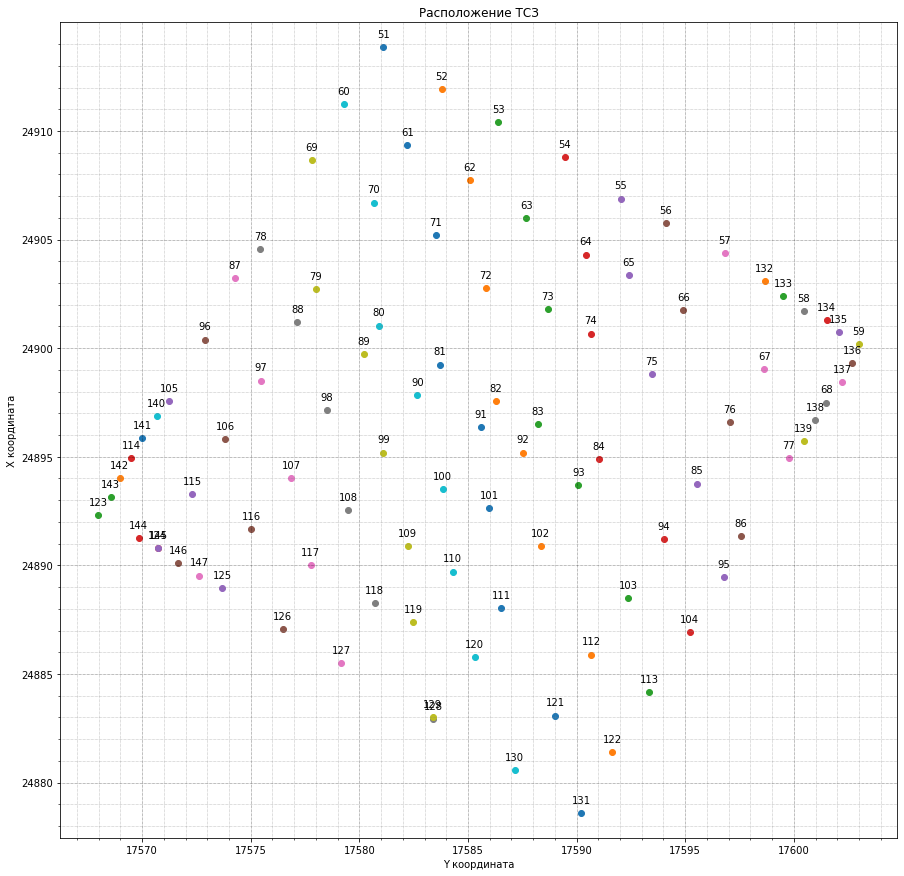

In [16]:
y = house_3["x"]
x = house_3["y"]
labels = house_3["тсз"]

plt.figure(figsize=(15, 15))

# Располагаем точки на графике
for i in range(len(x)):
    plt.scatter(x[i], y[i], label=f'{labels[i]} ({x[i]}, {y[i]})')
# Добавляем подписи к точкам
    plt.annotate(labels[i], (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

plt.title('Расположение ТСЗ')
plt.xlabel('Y координата')
plt.ylabel('X координата')
# Сохранение пропорций X Y
plt.axis('equal')
# Добавляем основную сетку
plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
# Добавляем дополнительную сетку
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
# Включаем дополнительные деления на осях
plt.minorticks_on()
plt.show()

## Построение по скважинам

In [17]:
df_boreholes = pd.read_excel(f"data/координаты_скважин.xlsx")
boreholes = house_3["тсз"].unique()
soils = ['суп.', 'сугл.', 'глина']

### Зависимость E(h)

In [18]:
"""
Статистика между грунтами по каждой скважине
"""
E_describe = None
E_desc_filter = None

for borehole in boreholes:
    
    df = pd.read_excel(f"data/тсз{borehole}.xlsx")
    df = df.loc[:, ["E", "soil_kind"]]
    df_filter = get_filter_df(df, "E")
    
    for soil in df["soil_kind"].unique():
        df_soil = df.query('soil_kind == @soil')
        df_filter_soil = df_filter.query('soil_kind == @soil')
        
        if df_soil.shape[0] < 5 or df_filter_soil.shape[0] < 5:
            continue
        
        desc_df_soil = df_soil["E"].describe(percentiles=[.5]).T.apply(lambda x: round(x, 1))
        desc_df_soil["грунт"] = soil
        desc_df_soil["скважина"] = borehole

        desc_df_filter_soil = df_filter_soil["E"].describe(percentiles=[.5]).T.apply(lambda x: round(x, 1))
        desc_df_filter_soil["грунт"] = soil
        desc_df_filter_soil["скважина"] = borehole
            
        if E_describe is None:
            E_describe = desc_df_soil.copy()
        else:
            E_describe = pd.concat([E_describe, desc_df_soil], ignore_index=True, axis=1)

        if E_desc_filter is None:
            E_desc_filter = desc_df_filter_soil.copy()
        else:
            E_desc_filter = pd.concat([E_desc_filter, desc_df_filter_soil], ignore_index=True, axis=1)

        
    desc_df = df["E"].describe(percentiles=[.5]).T.apply(lambda x: round(x, 1))
    desc_df["грунт"] = "все"
    desc_df["скважина"] = borehole
    E_describe = pd.concat([E_describe, desc_df], ignore_index=True, axis=1)

    desc_df_filter = df_filter["E"].describe(percentiles=[.5]).T.apply(lambda x: round(x, 1))
    desc_df_filter["грунт"] = "все"
    desc_df_filter["скважина"] = borehole
    E_desc_filter = pd.concat([E_desc_filter, desc_df_filter], ignore_index=True, axis=1)


E_describe = E_describe.T
E_describe["скважина"] = E_describe["скважина"].apply(int)
E_describe.set_index(['скважина', 'грунт'], inplace=True)
E_describe.to_excel("data/E_describe_house3.xlsx")

E_desc_filter = E_desc_filter.T
E_desc_filter["скважина"] = E_desc_filter["скважина"].apply(int)
E_desc_filter.set_index(['скважина', 'грунт'], inplace=True)
E_desc_filter.to_excel("data/E_describe_filter_house3.xlsx")

In [19]:
df_test = pd.read_excel("data/E_describe_filter_house3.xlsx")
df_test[df_test["грунт"]!="все"].groupby(by="грунт").mean()


,скважина,count,mean,std,min,50%,max
грунт,,,,,,,
глина,NaN,9.722222,9.700000,2.322222,6.380556,9.769444,12.919444
пес.м,98.591549,14.967742,9.022581,4.405376,6.092473,7.202151,18.890323
пес.п,142.000000,14.595745,10.775532,4.985106,6.176596,9.209574,21.072340
пес.с,114.200000,9.111111,6.000000,0.000000,6.000000,6.000000,6.000000
сугл.,NaN,45.546392,12.764948,4.320619,5.409278,12.627835,21.177320
суп.,79.500000,167.845361,10.709278,4.447423,7.000000,8.554639,25.049485
торф,96.166667,13.666667,0.000000,0.000000,0.000000,0.000000,0.000000


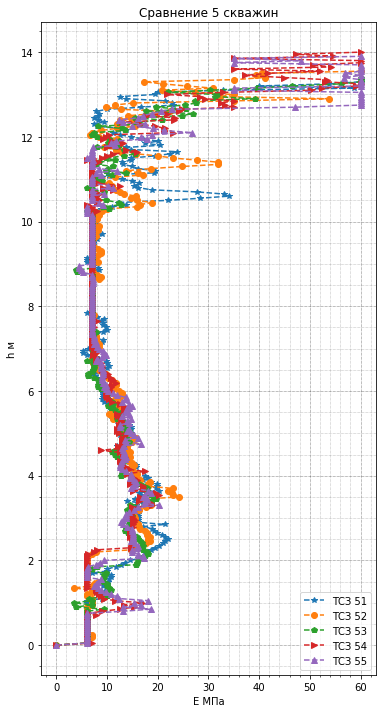

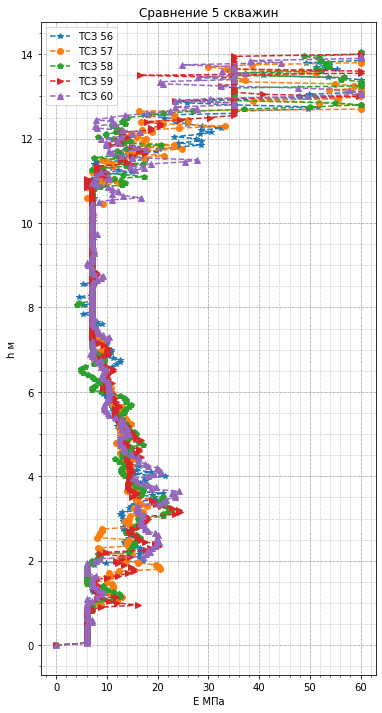

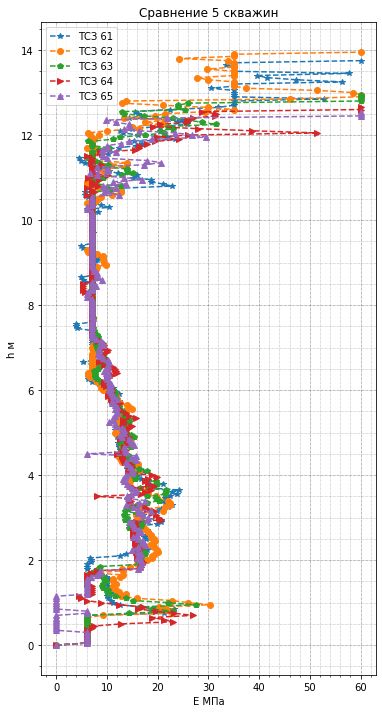

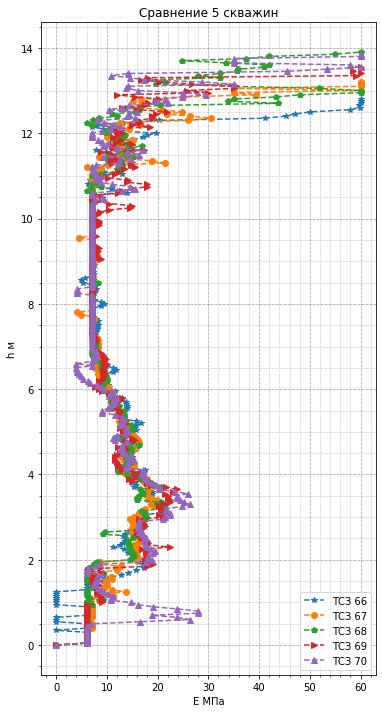

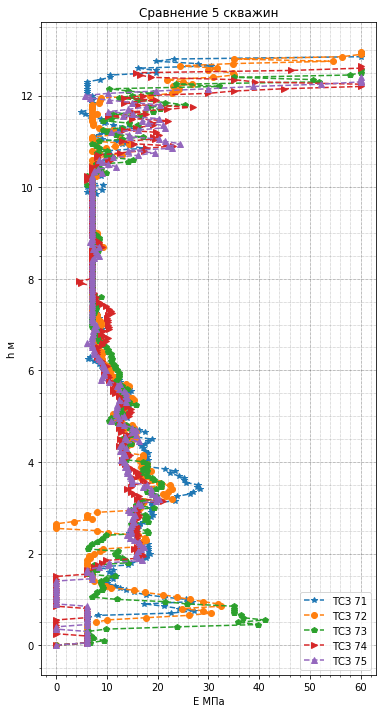

...

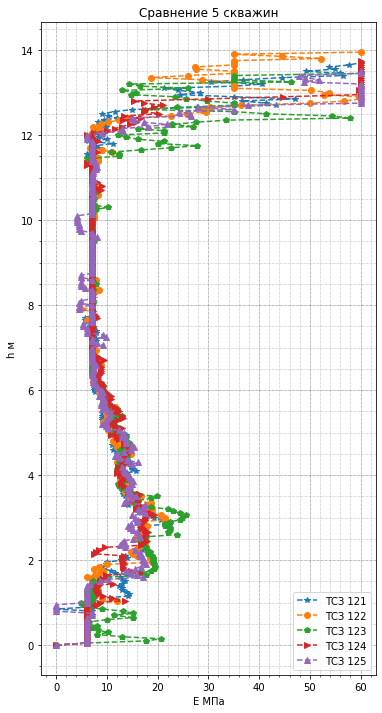

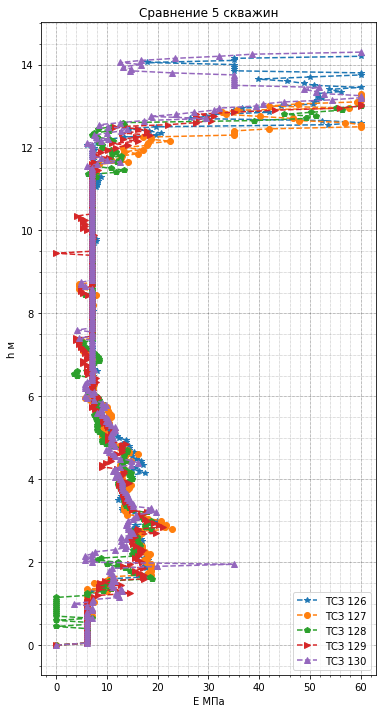

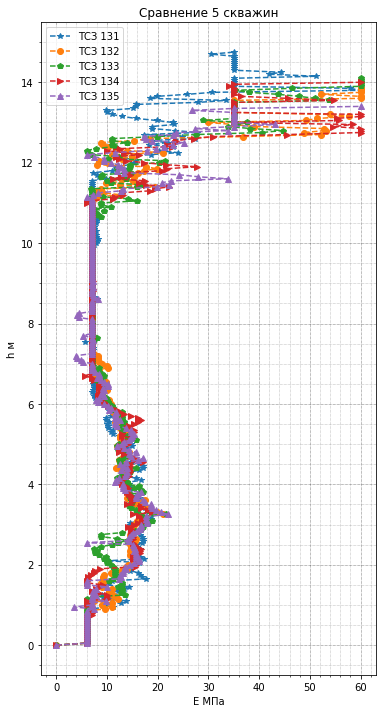

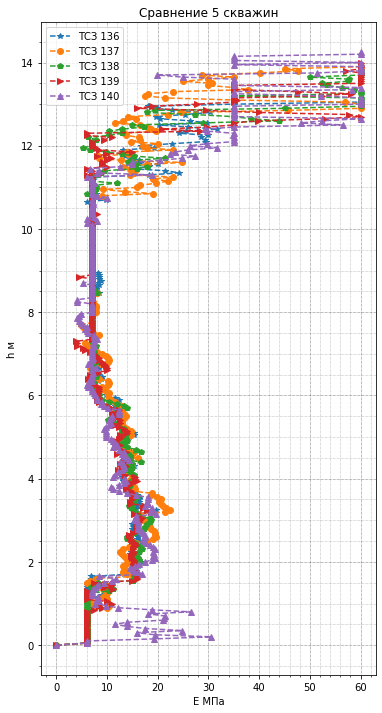

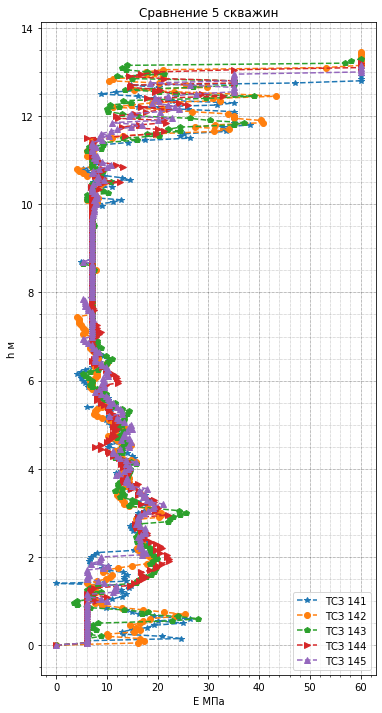

In [20]:
"""
Построение первых 5 скважин на один график
"""
markers = ["--*", "--o", "--p", "-->", "--^"]
for i in range(len(boreholes)//5):
    plt.figure(figsize=(6, 12))
    plt.title(f"Сравнение 5 скважин")
    plt.xlabel("E МПа")
    plt.ylabel("h м")
    # Добавляем основную сетку
    plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
    # Добавляем дополнительную сетку
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
    # Включаем дополнительные деления на осях
    plt.minorticks_on()
    
    for j in range(5*i, 5*(i+1)):
        borehole = boreholes[j]
        df = pd.read_excel(f"data/тсз{borehole}.xlsx")
        plt.plot(df["E"], df["h"], markers[j%5], label=f"ТСЗ {borehole}")

    plt.legend()
    plt.show()


### Корреляция по 5 скважинам на одном графике

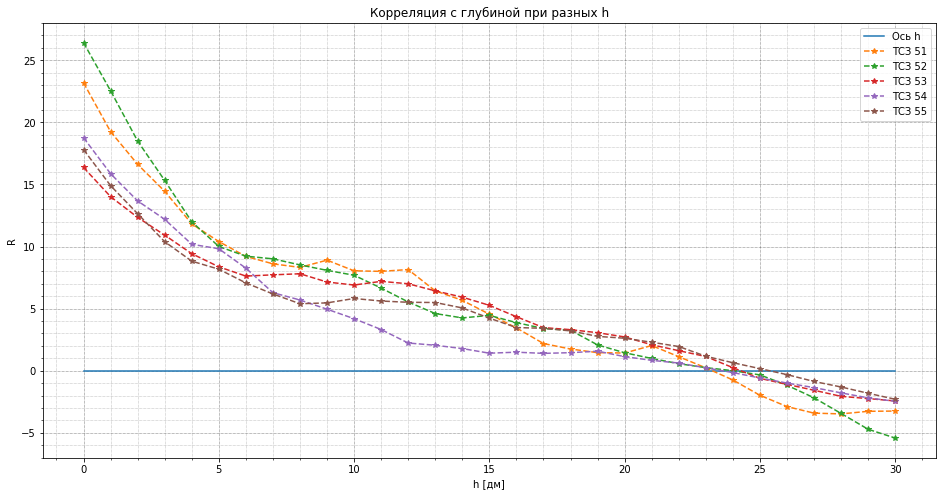

In [66]:
h_max = 30
h_list = range(h_max + 1)

plt.figure(figsize=(16, 8))
plt.title(f"Корреляция с глубиной при разных h")
plt.xlabel("h [дм]")
plt.ylabel("R")
# Добавляем основную сетку
plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
# Добавляем дополнительную сетку
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
# Включаем дополнительные деления на осях
plt.minorticks_on()

plt.plot([0, h_max], [0, 0], label="Ось h")
#plt.plot([0, 0], [0, 1], label="Ось R")

for borehole in boreholes[:5]:
    df = pd.read_excel(f"data/тсз{borehole}.xlsx").loc[:, ["h", "E"]]
    df = get_filter_df(df, "E")
    df["group"] = df["h"].apply(lambda x: int(x*100//10))
    df = df.groupby(by="group").mean()
    df.reset_index(drop=True, inplace=True)
    corr_list = corr_for_arr(df["E"], h_max=h_max, norm=False)
    plt.plot(h_list, corr_list, "--*", label=f"ТСЗ {borehole}")

plt.legend()
plt.show()

### Построение графика для тсз 51-59 по видам грунта

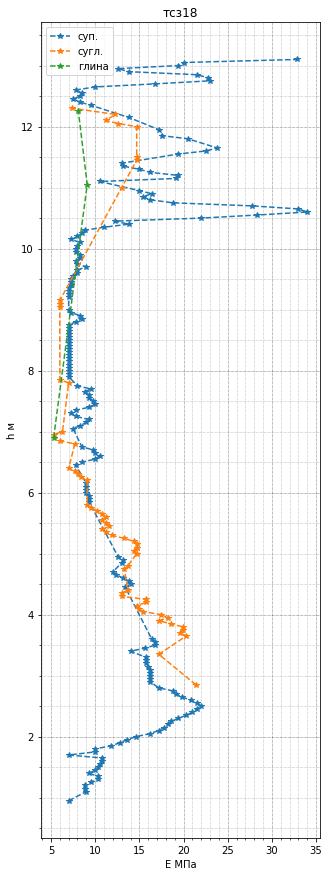

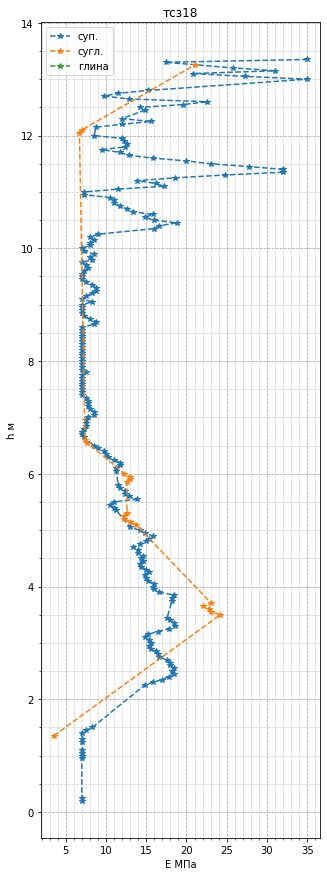

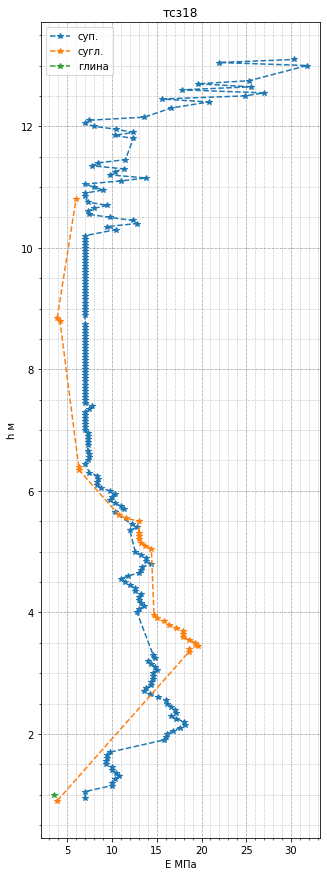

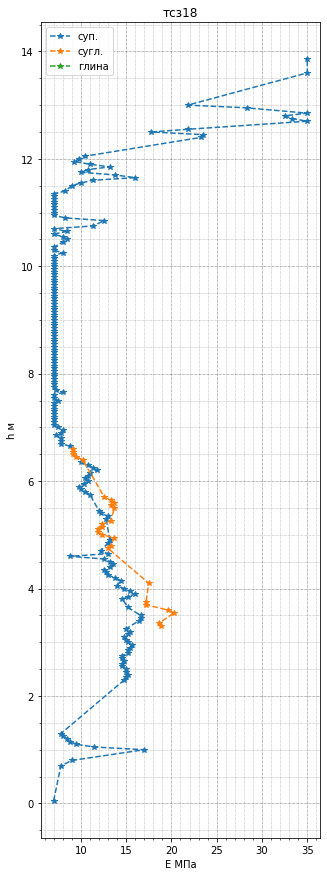

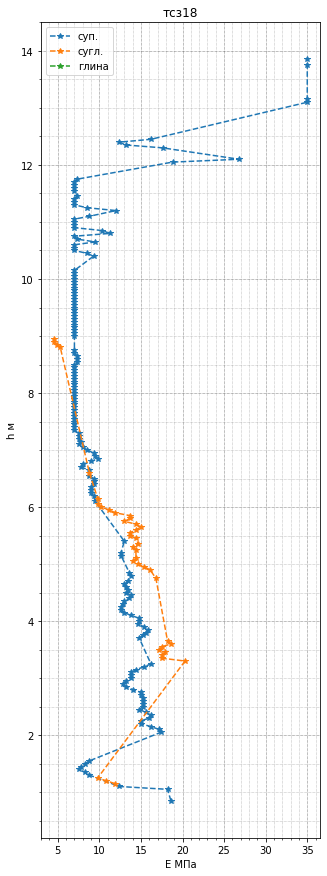

...

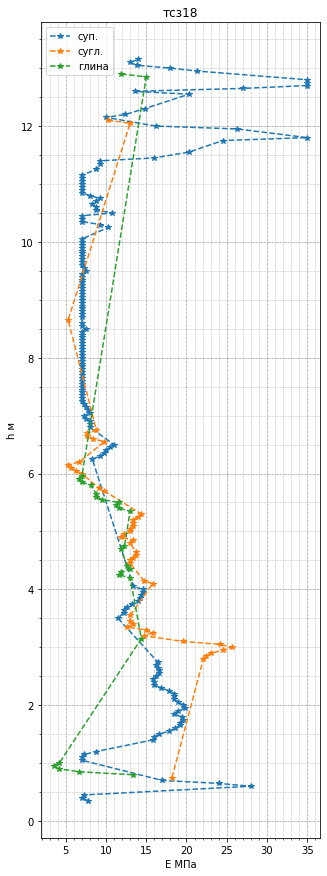

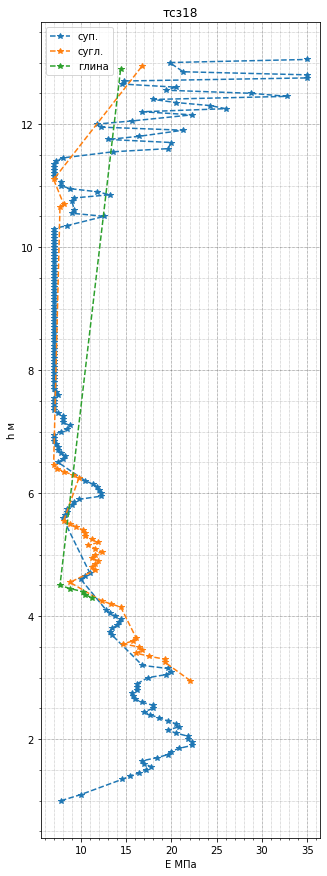

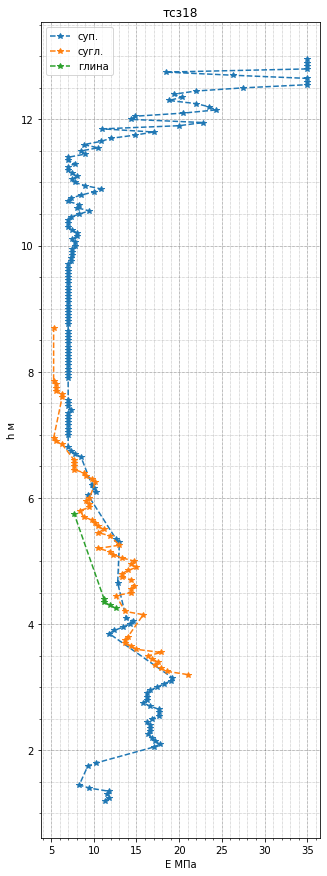

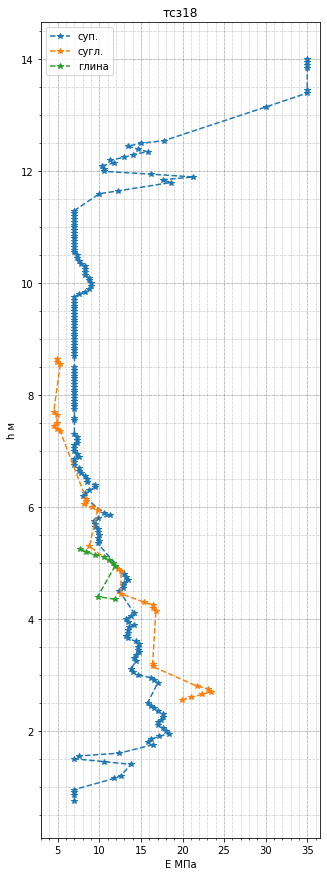

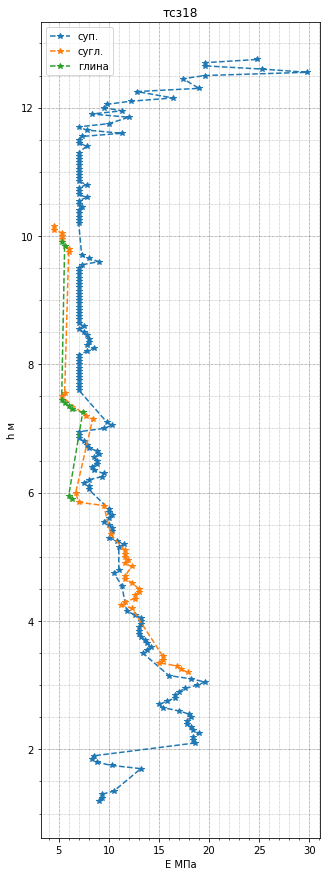

Все виды грунтов, которые есть: {'глина', 'пес.п', 'пес.м', 'сугл.', 'суп.', 'пес.с', 'торф'}


In [22]:
soils_set = set([])

for borehole in boreholes:
    plt.figure(figsize=(5, 15))
    plt.title(f"тсз{i}")
    plt.xlabel("E МПа")
    plt.ylabel("h м")
    # Добавляем основную сетку
    plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
    # Добавляем дополнительную сетку
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
    # Включаем дополнительные деления на осях
    plt.minorticks_on()
    
    df = pd.read_excel(f"data/тсз{borehole}.xlsx")
    
    soils_set.update(df["soil_kind"].unique())

    for soil in soils:
        df_now = df.query('soil_kind == @soil')
        plt.plot(df_now["E"], df_now["h"], "--*", label=soil)

    plt.legend()
    plt.show()
    
print("Все виды грунтов, которые есть:", soils_set)

### Корреляция по скважинам

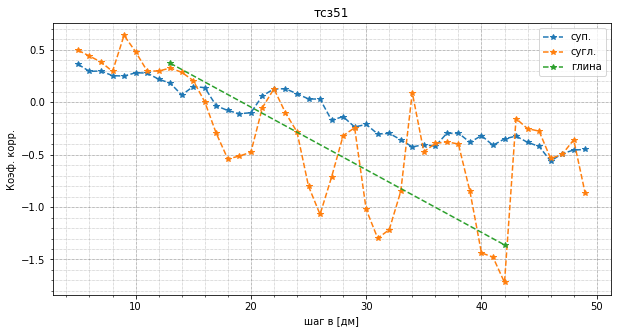

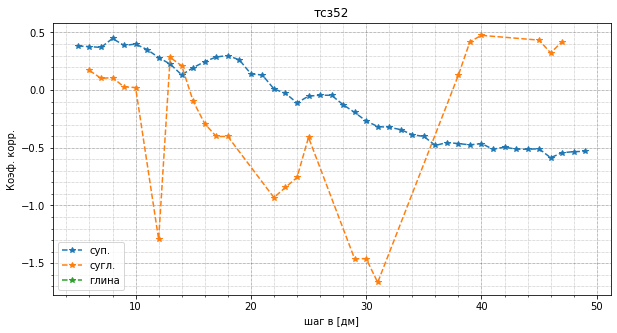

In [23]:
for i in range(boreholes[0], boreholes[1]+1):
    df_b = pd.read_excel(f"data/тсз{i}.xlsx")
    
    plt.figure(figsize=(10, 5))
    plt.title(f"тсз{i}")
    plt.xlabel("шаг в [дм]")
    plt.ylabel("Коэф. корр.")
    # Добавляем основную сетку
    plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
    # Добавляем дополнительную сетку
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
    # Включаем дополнительные деления на осях
    plt.minorticks_on()
    plt.grid(True)

    for soil in soils:
        df = df_b.query('soil_kind == @soil')

        borehole = df_boreholes[df_boreholes["тсз"]==i].iloc[0]
        z0 = borehole["z"]
        df["z"] = z0 - df["h"]


        points = df["z"].to_numpy().reshape([-1, 1])*10
        values = df["E"].to_numpy()

        arr_test = np.array([[get_R(i), i]  for i in range(5, 50)])
        df_test = pd.DataFrame(arr_test)
        df_test = df_test.dropna()
        
        #plt.stem(df_test[1], df_test[0])
        plt.plot(df_test[1], df_test[0], "--*", label=soil)
        
    plt.legend()
    plt.show()

### Корреляция по радуису отдаления

In [24]:
matrix = matrix_distance(house_3.loc[:, ["x", "y"]].to_numpy())[0]
house_3["distance"] = matrix

In [25]:
"""
Объединение данных в один датасет и сохранение в xlsx
"""
sample_h3 = None

for i in house_3["тсз"].unique():
    df_b = pd.read_excel(f"data/тсз{i}.xlsx")
    df_b["тсз"] = i
    
    if sample_h3 is None:
        sample_h3 = df_b.copy()
    else:
        sample_h3 = pd.concat([sample_h3, df_b], 
                              axis=0,
                              ignore_index=True
                             )

sample_h3 = sample_h3.merge(house_3, how="left", on="тсз")    
print(sample_h3.info())

sample_h3.to_excel("data/точки_дом_3.xlsx", index=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26079 entries, 0 to 26078
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   h            26079 non-null  float64
 1   qc_time      26079 non-null  int64  
 2   qc           26079 non-null  float64
 3   fs_time      26079 non-null  int64  
 4   fs           26079 non-null  int64  
 5   U            26079 non-null  object 
 6   soil_contur  26079 non-null  object 
 7   R            26079 non-null  object 
 8   soil_kind    26079 non-null  object 
 9   soil_status  26079 non-null  object 
 10  fi           26079 non-null  int64  
 11  C            26079 non-null  int64  
 12  E            26079 non-null  float64
 13  тсз          26079 non-null  int64  
 14  x            26079 non-null  float64
 15  y            26079 non-null  float64
 16  z            26079 non-null  float64
 17  distance     26079 non-null  float64
dtypes: float64(7), int64(6), object(5)
memory usag

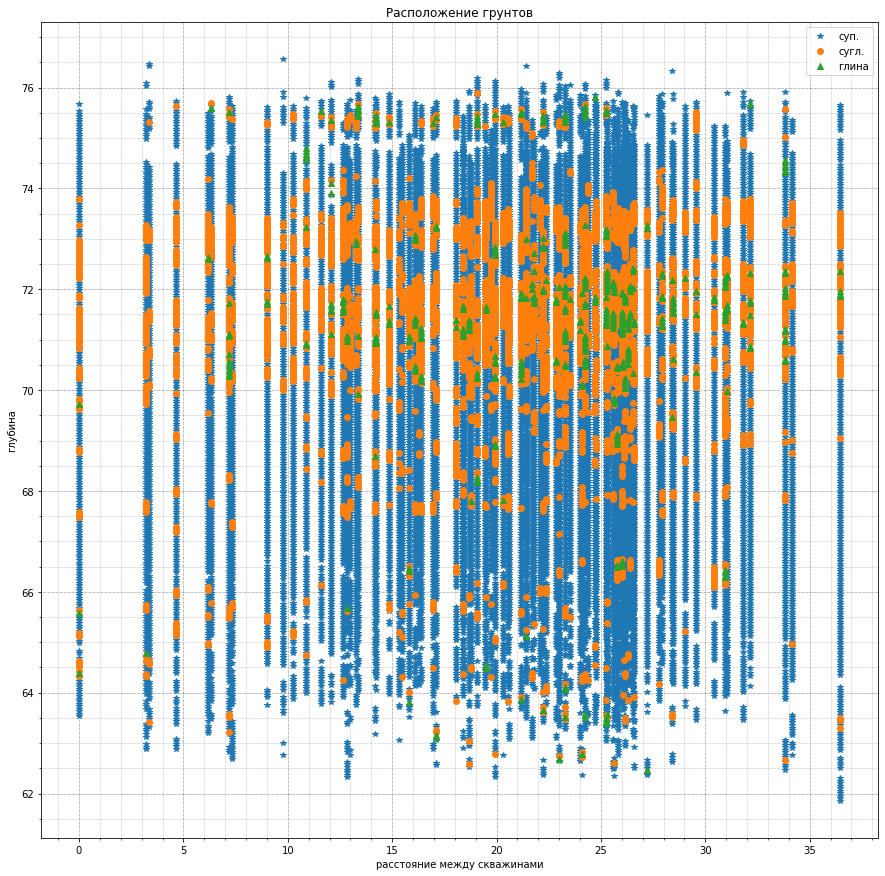

In [26]:
df_sample = sample_h3[sample_h3["soil_kind"].isin({'суп.', 'сугл.', 'глина'})].loc[:, ["тсз", "soil_kind", "distance", "h", "z", "E"]]


markers = ["*", "o", "^"]

plt.figure(figsize=(15, 15))
plt.title('Расположение грунтов')
plt.xlabel('расстояние между скважинами')
plt.ylabel('глубина')
# Сохранение пропорций X Y
#plt.axis('equal')
# Добавляем основную сетку
plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
# Добавляем дополнительную сетку
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
# Включаем дополнительные деления на осях
plt.minorticks_on()

for i in range(len(soils)):
    df_s = df_sample[df_sample["soil_kind"] == soils[i]]
    
    plt.plot(df_s["distance"], df_s["z"] - df_s["h"], markers[i], label=soils[i])

plt.legend()
plt.show()

#### суглинок

In [27]:
sample_clay = sample_h3[sample_h3["soil_kind"] == "сугл."]
sample_clay["sample_z"] = sample_clay["z"] - sample_clay["h"]


In [28]:
pd.concat((pd.DataFrame({"step":[0], "R":[1]}), df_R))

NameError: name 'df_R' is not defined

In [ ]:
min_z = sample_clay["sample_z"].min()
max_z = sample_clay["sample_z"].max()


sample_clay["group_z"] = sample_clay["sample_z"].apply(lambda x: int(x//1))


for plane in sample_clay["group_z"].unique():
    df_now = sample_clay.query('group_z == @plane').loc[:, ["E", "тсз", "x", "y", "sample_z", "distance"]]
    df_now = df_now.groupby(by=["тсз"]).mean()
    #print(plane, df_now.shape)
    
    """
    Считаем коэф. корр.
    """
    points = df_now.loc[:, ["x", "y", "sample_z"]].to_numpy()
    values = df_now["E"].to_numpy()
    df_R = pd.DataFrame({"step": range(1, 20),
                         "R": [filter_matrix_1(points, values, [i-1, i]) 
                               for i in range(1, 20)
                              ]
                        }
                       )
    df_R = df_R.dropna(how="any")
    df_R = pd.concat((pd.DataFrame({"step":[0], "R":[1]}), df_R), ignore_index=True)
    
    """
    график
    """
    plt.figure(figsize=(12, 4))
    plt.title(f"отметка от {plane-1} до {plane}, кол. скв. {df_now.shape[0]}")
    plt.xlabel("шаг в [м]")
    plt.ylabel("Коэф. корр.")
    # Добавляем основную сетку
    plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')
    # Добавляем дополнительную сетку
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
    # Включаем дополнительные деления на осях
    plt.minorticks_on()
    plt.grid(True)
    
    plt.plot(df_R["step"], df_R["R"], "--*")
    plt.plot([0, 20], [0, 0])
    plt.plot([0, 0], [-1, 1])
        
    #plt.legend()
    plt.show()


### Корреляция 2D, R(d) при разных шагах x и y

In [ ]:
corr_step = 1
corr_size = 10

In [ ]:
sample_clay.head()

In [ ]:
df_now = sample_clay.query('group_z == 73').loc[:, ["E", "тсз", "x", "y", "sample_z", "distance"]]
df_now = df_now.groupby(by=["тсз"]).mean()


points = df_now.loc[:, ["x", "y"]].to_numpy()
values = df_now["E"].to_numpy()

matrix_corr_3 = np.nan_to_num(create_matrix_corr_XY(points, values, size=corr_size, step=corr_step))

In [ ]:
data = np.where(matrix_corr_3 is None, 0, matrix_corr_3)

# Создаем координатные оси для данных
x = np.arange(data.shape[1])
y = np.arange(data.shape[0])

# Создаем сетку координат для графика
X, Y = np.meshgrid(x, y)

# Строим контурный график с заливкой
contourf_plot = plt.contourf(X, Y, data, cmap='RdYlGn')

# Добавляем цветовую шкалу
plt.colorbar(contourf_plot, 
             #ticks=[0, 0.25,  0.5, 0.75, 1]
            )

# Добавляем заголовок и метки осей
plt.title('Матрица коэф. корр.')
plt.xlabel('шаг по Y')
plt.ylabel('шаг по X')

# Показываем график
plt.show()

In [ ]:
A = np.array([[4, 2], [1, 3]])

# Вычисляем собственные значения и собственные векторы
eigenvalues, eigenvectors = np.linalg.eig(A)

print("Собственные значения:", eigenvalues)
print("Собственные векторы:", eigenvectors)